![](https://www.pata.org/wp-content/uploads/2014/09/TripAdvisor_Logo-300x119.png)
# Predict TripAdvisor Rating
## В этом соревновании нам предстоит предсказать рейтинг ресторана в TripAdvisor
**По ходу задачи:**
* Прокачаем работу с pandas
* Научимся работать с Kaggle Notebooks
* Поймем как делать предобработку различных данных
* Научимся работать с пропущенными данными (Nan)
* Познакомимся с различными видами кодирования признаков
* Немного попробуем [Feature Engineering](https://ru.wikipedia.org/wiki/Конструирование_признаков) (генерировать новые признаки)
* И совсем немного затронем ML
* И многое другое...   



### И самое важное, все это вы сможете сделать самостоятельно!

*Этот Ноутбук являетсся Примером/Шаблоном к этому соревнованию (Baseline) и не служит готовым решением!*   
Вы можете использовать его как основу для построения своего решения.

> что такое baseline решение, зачем оно нужно и почему предоставлять baseline к соревнованию стало важным стандартом на kaggle и других площадках.   
**baseline** создается больше как шаблон, где можно посмотреть как происходит обращение с входящими данными и что нужно получить на выходе. При этом МЛ начинка может быть достаточно простой, просто для примера. Это помогает быстрее приступить к самому МЛ, а не тратить ценное время на чисто инженерные задачи. 
Также baseline являеться хорошей опорной точкой по метрике. Если твое решение хуже baseline - ты явно делаешь что-то не то и стоит попробовать другой путь) 

В контексте нашего соревнования baseline идет с небольшими примерами того, что можно делать с данными, и с инструкцией, что делать дальше, чтобы улучшить результат.  Вообще готовым решением это сложно назвать, так как используются всего 2 самых простых признака (а остальные исключаются).

# import

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

# Загружаем специальный удобный инструмент для разделения датасета:
from sklearn.model_selection import train_test_split

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

import re
# MinMax нормализация 
from sklearn.preprocessing import MinMaxScaler
# Зададим кол-во символов для показа
pd.options.display.max_colwidth = 80
# выводить все столбцы
pd.set_option('display.max_columns', None)

plt.rcParams['figure.figsize'] = (13,5)

/kaggle/input/sf-dst-restaurant-rating/sample_submission.csv
/kaggle/input/sf-dst-restaurant-rating/main_task.csv
/kaggle/input/sf-dst-restaurant-rating/kaggle_task.csv


In [2]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42

In [3]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

# DATA

In [4]:
DATA_DIR = '/kaggle/input/sf-dst-restaurant-rating/'
df_train = pd.read_csv(DATA_DIR+'/main_task.csv')
df_test = pd.read_csv(DATA_DIR+'kaggle_task.csv')
sample_submission = pd.read_csv(DATA_DIR+'/sample_submission.csv')

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 10 columns):
Restaurant_id        40000 non-null object
City                 40000 non-null object
Cuisine Style        30717 non-null object
Ranking              40000 non-null float64
Rating               40000 non-null float64
Price Range          26114 non-null object
Number of Reviews    37457 non-null float64
Reviews              40000 non-null object
URL_TA               40000 non-null object
ID_TA                40000 non-null object
dtypes: float64(3), object(7)
memory usage: 3.1+ MB


In [6]:
df_train.head(5)

,Restaurant_id,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_5569,Paris,"['European', 'French', 'International']",5570.0,3.5,$$ - $$$,194.0,"[['Good food at your doorstep', 'A good hotel restaurant'], ['12/31/2017', '...",/Restaurant_Review-g187147-d1912643-Reviews-R_Yves-Paris_Ile_de_France.html,d1912643
1,id_1535,Stockholm,NaN,1537.0,4.0,NaN,10.0,"[['Unique cuisine', 'Delicious Nepalese food'], ['07/06/2017', '06/19/2016']]",/Restaurant_Review-g189852-d7992032-Reviews-Buddha_Nepal-Stockholm.html,d7992032
2,id_352,London,"['Japanese', 'Sushi', 'Asian', 'Grill', 'Vegetarian Friendly', 'Vegan Option...",353.0,4.5,$$$$,688.0,"[['Catch up with friends', 'Not exceptional'], ['01/08/2018', '01/06/2018']]",/Restaurant_Review-g186338-d8632781-Reviews-ROKA_Mayfair-London_England.html,d8632781
3,id_3456,Berlin,NaN,3458.0,5.0,NaN,3.0,"[[], []]",/Restaurant_Review-g187323-d1358776-Reviews-Esplanade-Berlin.html,d1358776
4,id_615,Munich,"['German', 'Central European', 'Vegetarian Friendly']",621.0,4.0,$$ - $$$,84.0,"[['Best place to try a Bavarian food', 'Nice building but improvements need ...",/Restaurant_Review-g187309-d6864963-Reviews-Augustiner_Schutzen_Garten-Munic...,d6864963


In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
Restaurant_id        10000 non-null object
City                 10000 non-null object
Cuisine Style        7693 non-null object
Ranking              10000 non-null float64
Price Range          6525 non-null object
Number of Reviews    9343 non-null float64
Reviews              9998 non-null object
URL_TA               10000 non-null object
ID_TA                10000 non-null object
dtypes: float64(2), object(7)
memory usage: 703.2+ KB


In [8]:
df_test.head(5)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_0,Paris,"['Bar', 'Pub']",12963.0,$$ - $$$,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-Le_Perchoir-Paris_Ile_de_France...,d10746918
1,id_1,Helsinki,"['European', 'Scandinavian', 'Gluten Free Options', 'Vegetarian Friendly', '...",106.0,$$ - $$$,97.0,"[['Very good reviews!', 'Fine dining in Hakaniemi'], ['12/05/2017', '10/29/2...",/Restaurant_Review-g189934-d6674944-Reviews-Ravintola_Kolmon3n-Helsinki_Uusi...,d6674944
2,id_2,Edinburgh,['Vegetarian Friendly'],810.0,$$ - $$$,28.0,"[['Better than the Links', 'Ivy Black'], ['12/28/2017', '12/06/2017']]",/Restaurant_Review-g186525-d13129638-Reviews-Black_Ivy-Edinburgh_Scotland.html,d13129638
3,id_3,London,"['Italian', 'Mediterranean', 'European', 'Vegetarian Friendly', 'Gluten Free...",1669.0,$$$$,202.0,"[['Most exquisite', 'Delicious and authentic'], ['12/06/2017', '11/22/2017']]",/Restaurant_Review-g186338-d680417-Reviews-Quirinale-London_England.html,d680417
4,id_4,Bratislava,"['Italian', 'Mediterranean', 'European', 'Seafood', 'Vegetarian Friendly', '...",37.0,$$$$,162.0,"[['Always the best in bratislava', 'Very good but pricey'], ['02/08/2018', '...",/Restaurant_Review-g274924-d1112354-Reviews-Massimo_Ristorante-Bratislava_Br...,d1112354


In [9]:
sample_submission.head(5)

,Restaurant_id,Rating
0,id_0,2.0
1,id_1,2.5
2,id_2,4.0
3,id_3,1.0
4,id_4,4.0


In [10]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
Restaurant_id    10000 non-null object
Rating           10000 non-null float64
dtypes: float64(1), object(1)
memory usage: 156.4+ KB


In [11]:
# ВАЖНО! дря корректной обработки признаков объединяем трейн и тест в один датасет
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['Rating'] = 0 # в тесте у нас нет значения Rating, мы его должны предсказать, по этому пока просто заполняем нулями

data = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
Restaurant_id        50000 non-null object
City                 50000 non-null object
Cuisine Style        38410 non-null object
Ranking              50000 non-null float64
Price Range          32639 non-null object
Number of Reviews    46800 non-null float64
Reviews              49998 non-null object
URL_TA               50000 non-null object
ID_TA                50000 non-null object
sample               50000 non-null int64
Rating               50000 non-null float64
dtypes: float64(3), int64(1), object(7)
memory usage: 4.2+ MB


Подробнее по признакам:
* City: Город 
* Cuisine Style: Кухня
* Ranking: Ранг ресторана относительно других ресторанов в этом городе
* Price Range: Цены в ресторане в 3 категориях
* Number of Reviews: Количество отзывов
* Reviews: 2 последних отзыва и даты этих отзывов
* URL_TA: страница ресторана на 'www.tripadvisor.com' 
* ID_TA: ID ресторана в TripAdvisor
* Rating: Рейтинг ресторана

In [13]:
data.sample(5)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating
26190,id_6425,Madrid,NaN,6428.0,NaN,51.0,"[['Good place with cheap prices', 'Quick and tasty with excellent service'],...",/Restaurant_Review-g187514-d990764-Reviews-Rodilla-Madrid.html,d990764,1,3.5
11331,id_8418,Madrid,NaN,8425.0,NaN,7.0,"[[], []]",/Restaurant_Review-g187514-d9737054-Reviews-Bianco_Cafe-Madrid.html,d9737054,1,2.0
1666,id_1666,Warsaw,"['Polish', 'International', 'European', 'Central European', 'Vegetarian Frie...",34.0,$$$$,375.0,"[['Michelin star means quality', 'Excellent Experience'], ['01/01/2018', '12...",/Restaurant_Review-g274856-d6546948-Reviews-Senses_Restaurant-Warsaw_Mazovia...,d6546948,0,0.0
7755,id_7755,Lyon,['Italian'],2536.0,NaN,3.0,"[['Good food, slightly overpriced'], ['02/03/2012']]",/Restaurant_Review-g187265-d2342862-Reviews-Resto_Pizza_Tavola-Lyon_Rhone_Au...,d2342862,0,0.0
38813,id_5725,Rome,NaN,5727.0,NaN,NaN,"[[], []]",/Restaurant_Review-g187791-d9726428-Reviews-Magie_Dolci_D_autore-Rome_Lazio....,d9726428,1,5.0


In [14]:
data.isna().sum()

Restaurant_id            0
City                     0
Cuisine Style        11590
Ranking                  0
Price Range          17361
Number of Reviews     3200
Reviews                  2
URL_TA                   0
ID_TA                    0
sample                   0
Rating                   0
dtype: int64

Как видим, большинство признаков у нас требует очистки и предварительной обработки.

# Cleaning and Prepping Data
Обычно данные содержат в себе кучу мусора, который необходимо почистить, для того чтобы привести их в приемлемый формат. Чистка данных — это необходимый этап решения почти любой реальной задачи.   
![](https://analyticsindiamag.com/wp-content/uploads/2018/01/data-cleaning.png)

## 1. Обработка признаков

### Признак Restaurant_id

In [15]:
# Создадим признак с количеством ресторанов в сети 

# Словарь, которым заполним новый признак {'Restaurant_id':count}
id_count = data.Restaurant_id.value_counts().to_dict()
data['Rest_id_count'] = data.Restaurant_id.replace(to_replace=id_count)

### Признак Number of Reviews

In [16]:
# Создаем отдельный столбец с пропусками в Reviews
data['Number_of_Reviews_isNAN'] = pd.isna(data['Number of Reviews']).astype('uint8')

In [17]:
# Далее заполняем пропуски единицей
#median_review = data['Number of Reviews'].median()
data['Number of Reviews'] = data['Number of Reviews'].fillna(1)
data.head(3)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating,Rest_id_count,Number_of_Reviews_isNAN
0,id_0,Paris,"['Bar', 'Pub']",12963.0,$$ - $$$,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-Le_Perchoir-Paris_Ile_de_France...,d10746918,0,0.0,16,0
1,id_1,Helsinki,"['European', 'Scandinavian', 'Gluten Free Options', 'Vegetarian Friendly', '...",106.0,$$ - $$$,97.0,"[['Very good reviews!', 'Fine dining in Hakaniemi'], ['12/05/2017', '10/29/2...",/Restaurant_Review-g189934-d6674944-Reviews-Ravintola_Kolmon3n-Helsinki_Uusi...,d6674944,0,0.0,10,0
2,id_2,Edinburgh,['Vegetarian Friendly'],810.0,$$ - $$$,28.0,"[['Better than the Links', 'Ivy Black'], ['12/28/2017', '12/06/2017']]",/Restaurant_Review-g186525-d13129638-Reviews-Black_Ivy-Edinburgh_Scotland.html,d13129638,0,0.0,15,0


### Признак Reviews

In [18]:
# Нормализуем количество отзывов относительно максимального в городе
reviews_in_city = data.groupby(['City'])['Number of Reviews'].max().sort_values(ascending=False).to_dict()
data['reviews_in_city'] = data['City'].replace(to_replace=reviews_in_city)

data['norm_rank_reviews'] = data['Ranking'] / data['reviews_in_city']

In [19]:
# create a template for search
lrx = re.compile('\[\[.*\]\]')
nan = None


def review_extraction(row):
    '''Function is called for extracting data from column 
    reviews and splitting it out into a separate columns
    INPUT: Whole dataset
    OUTPUT: Dataset with additional columns'''

    cell = row['Reviews']    # TYPE here your COLUMN
    aux_list = [[], []]  # create an auxilliary list for saving temp.data
    if type(cell) == str and lrx.fullmatch(cell):  # compare with searech template
        aux_list = eval(cell)  # transform into a list


    row['first_date'] = pd.to_datetime(
        aux_list[1][1] if len(aux_list[1]) > 1 else nan)
    row['last_date'] = pd.to_datetime(aux_list[1][0] if len(
        aux_list[1]) > 0 else nan, format='%m/%d/%Y', errors='coerce')
    row['first_date'] = pd.to_datetime(row['first_date'])
    row['last_date'] = pd.to_datetime(row['last_date'])

    return row


In [20]:
# Применяем функцию
data = data.apply(review_extraction, axis=1)

In [21]:
# Считаем разницу в днях между отзывами (исправляя отрицательную разницу), пустоты заполняем модой
data['rev_date_diff'] = abs(data['last_date'] - data['first_date']).apply(lambda x: x.days).fillna(1)
data.sample(3)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating,Rest_id_count,Number_of_Reviews_isNAN,reviews_in_city,norm_rank_reviews,first_date,last_date,rev_date_diff
28701,id_5472,Milan,NaN,5475.0,NaN,1.0,"[[], []]",/Restaurant_Review-g187849-d5861809-Reviews-La_Sana_Gola-Milan_Lombardy.html,d5861809,1,3.0,4,1,6360.0,0.860849,NaT,NaT,1.0
7611,id_7611,Berlin,['Japanese'],1262.0,$$$$,24.0,"[['Japanese hospitality in an intimate settin...', 'Unique experience'], ['1...",/Restaurant_Review-g187323-d10810672-Reviews-Shiori-Berlin.html,d10810672,0,0.0,3,0,2572.0,0.490669,2017-10-12,2017-10-14,2.0
49540,id_1476,Edinburgh,NaN,1479.0,NaN,11.0,"[['Second Day of January... After a Rainy Sta...', 'top class'], ['01/08/201...",/Restaurant_Review-g186525-d9714867-Reviews-Marks_and_Spencer-Edinburgh_Scot...,d9714867,1,3.5,14,0,4567.0,0.323845,2017-09-15,2018-01-08,115.0


### Признак Ranking

In [22]:
# Нормализуем ранг ресторана относительно максимального ранга в городе
data['Ranking_norm'] = data['Ranking'] / data['City'].map(data.groupby(['City'])['Ranking'].max())

In [23]:
# Считаем количество ресторанов в городе
data['rest_in_city'] = data.groupby('City')['Restaurant_id'].transform('count')

In [24]:
# Взаимно нормализуем ранги и кол-во ресторанов в городах 
data['norm_rest_rank'] = data['rest_in_city']/data['Ranking']
data['norm_rank_rest'] = data['Ranking']/data['rest_in_city']

### Признак City

In [25]:
# для One-Hot Encoding в pandas есть готовая функция - get_dummies. Особенно радует параметр dummy_na 
# оздадим копию, возможно оригинал нам потом пригодится
data['City_'] = data['City']
data = pd.get_dummies(data, columns=[ 'City_',], dummy_na=True)

In [26]:
data.sample(3)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating,Rest_id_count,Number_of_Reviews_isNAN,reviews_in_city,norm_rank_reviews,first_date,last_date,rev_date_diff,Ranking_norm,rest_in_city,norm_rest_rank,norm_rank_rest,City__Amsterdam,City__Athens,City__Barcelona,City__Berlin,City__Bratislava,City__Brussels,City__Budapest,City__Copenhagen,City__Dublin,City__Edinburgh,City__Geneva,City__Hamburg,City__Helsinki,City__Krakow,City__Lisbon,City__Ljubljana,City__London,City__Luxembourg,City__Lyon,City__Madrid,City__Milan,City__Munich,City__Oporto,City__Oslo,City__Paris,City__Prague,City__Rome,City__Stockholm,City__Vienna,City__Warsaw,City__Zurich,City__nan
43798,id_5213,London,"['Bar', 'British', 'Pub']",5222.0,$$ - $$$,73.0,"[['Proper pub!', 'Good pub not good food'], ['11/02/2017', '08/10/2017']]",/Restaurant_Review-g186338-d3954520-Reviews-Cock_Lion-London_England.html,d3954520,1,3.5,4,0,9660.0,0.540580,2017-08-10,2017-11-02,84.0,0.317563,7193,1.377442,0.725984,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11400,id_810,Rome,"['Italian', 'Bar', 'Mediterranean', 'European', 'Vegetarian Friendly']",811.0,$$$$,1218.0,"[['Delicious but on the pricey side', 'Very good lunch but a bit pricey'], [...",/Restaurant_Review-g187791-d696572-Reviews-Harry_s_Bar-Rome_Lazio.html,d696572,1,4.0,10,0,8927.0,0.090848,2017-11-19,2017-11-21,2.0,0.136348,2589,3.192355,0.313248,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
25839,id_2864,London,"['Dutch', 'European', 'Vegetarian Friendly', 'Gluten Free Options']",2869.0,$$ - $$$,240.0,"[['Great for the family.', 'Tasty salty and sweet pancakes'], ['01/03/2018',...",/Restaurant_Review-g186338-d1421250-Reviews-My_Old_Dutch_Kensington-London_E...,d1421250,1,4.0,4,0,9660.0,0.296998,2017-11-19,2018-01-03,45.0,0.174471,7193,2.507145,0.398860,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Признак Price Range

In [27]:
# Создадим признак, показывающий, что цена была не указана
data['Price_Range_nan'] = pd.isna(data['Price Range']).astype('uint8')

In [28]:
# Заменим символы цен на цифры 
data['Price_Range_num'] = data['Price Range'].replace(to_replace={'$':1, '$$ - $$$':2, '$$$$':3})
# Пустоты просто заполним серединой (это мода по всем городам)
data['Price_Range_num'] = data['Price_Range_num'].fillna(2)

In [29]:
data.sample(3)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating,Rest_id_count,Number_of_Reviews_isNAN,reviews_in_city,norm_rank_reviews,first_date,last_date,rev_date_diff,Ranking_norm,rest_in_city,norm_rest_rank,norm_rank_rest,City__Amsterdam,City__Athens,City__Barcelona,City__Berlin,City__Bratislava,City__Brussels,City__Budapest,City__Copenhagen,City__Dublin,City__Edinburgh,City__Geneva,City__Hamburg,City__Helsinki,City__Krakow,City__Lisbon,City__Ljubljana,City__London,City__Luxembourg,City__Lyon,City__Madrid,City__Milan,City__Munich,City__Oporto,City__Oslo,City__Paris,City__Prague,City__Rome,City__Stockholm,City__Vienna,City__Warsaw,City__Zurich,City__nan,Price_Range_nan,Price_Range_num
17339,id_1799,Paris,['French'],1800.0,$$ - $$$,210.0,"[['Neighborhood Restaurant', 'Classic French Bistro'], ['06/13/2017', '03/20...",/Restaurant_Review-g187147-d782539-Reviews-Le_Baribal-Paris_Ile_de_France.html,d782539,1,4.0,11,0,7622.0,0.236158,2017-03-20,2017-06-13,85.0,0.128700,6108,3.393333,0.294695,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2.0
5738,id_5738,Oslo,['Chinese'],565.0,$$ - $$$,27.0,"[['Food below average, spring rolls with rott...', 'really bad experience'],...",/Restaurant_Review-g190479-d8016322-Reviews-Hylla_Cafe_og_Spiseri-Oslo_Easte...,d8016322,0,0.0,5,0,1391.0,0.406183,2016-12-16,2017-06-04,170.0,0.496922,488,0.863717,1.157787,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2.0
18339,id_1668,Madrid,"['Seafood', 'Spanish']",1670.0,$$ - $$$,92.0,"[['Authentic Spanish Restaurant', 'Good for locals'], ['06/04/2017', '06/23/...",/Restaurant_Review-g187514-d952910-Reviews-Restaurante_Luis-Madrid.html,d952910,1,4.0,9,0,6013.0,0.277732,2016-06-23,2017-06-04,346.0,0.189579,3813,2.283234,0.437975,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0


### Признак ID_TA

In [30]:
# Превращаем в числовой формат
data['ID_TA'] = data['ID_TA'].apply(lambda x: int(x[1:]))

In [31]:
data.sample(3)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating,Rest_id_count,Number_of_Reviews_isNAN,reviews_in_city,norm_rank_reviews,first_date,last_date,rev_date_diff,Ranking_norm,rest_in_city,norm_rest_rank,norm_rank_rest,City__Amsterdam,City__Athens,City__Barcelona,City__Berlin,City__Bratislava,City__Brussels,City__Budapest,City__Copenhagen,City__Dublin,City__Edinburgh,City__Geneva,City__Hamburg,City__Helsinki,City__Krakow,City__Lisbon,City__Ljubljana,City__London,City__Luxembourg,City__Lyon,City__Madrid,City__Milan,City__Munich,City__Oporto,City__Oslo,City__Paris,City__Prague,City__Rome,City__Stockholm,City__Vienna,City__Warsaw,City__Zurich,City__nan,Price_Range_nan,Price_Range_num
29477,id_625,Hamburg,['Italian'],626.0,$$ - $$$,32.0,"[['Best pasta In Hamburg'], ['05/14/2016']]",/Restaurant_Review-g187331-d6373394-Reviews-Ristorante_Caruso-Hamburg.html,6373394,1,4.5,10,0,845.0,0.740828,NaT,2016-05-14,1.0,0.228718,1186,1.894569,0.527825,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0
37828,id_7871,London,"['Indian', 'Vegetarian Friendly']",7880.0,$$ - $$$,205.0,"[['Ok meal but not the best ambience', 'Decent value'], ['12/23/2017', '11/2...",/Restaurant_Review-g186338-d2068522-Reviews-Chambeli_Restaurant-London_Engla...,2068522,1,3.5,2,0,9660.0,0.815735,2017-11-22,2017-12-23,31.0,0.479202,7193,0.912817,1.095510,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0
44925,id_12758,Paris,NaN,12760.0,NaN,22.0,"[['An option for Japanese food', 'Poor quality food, poor service'], ['05/06...",/Restaurant_Review-g187147-d1337431-Reviews-Japorama-Paris_Ile_de_France.html,1337431,1,2.5,2,0,7622.0,1.674101,2016-01-19,2017-05-06,473.0,0.912341,6108,0.478683,2.089064,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,2.0


### Признак Cuisine Style

In [32]:
# Заполняем пустоту на кухнях
data['Cuisine Style'] = data['Cuisine Style'].fillna("['Unknown']")  # "['Unknown']"

# Преобразование строки в столбце в список
data['Cuisine Style'] = data['Cuisine Style'].apply(
    lambda x: eval(x))  # transforming to a list

# Количество кухонь у ресторана
data['Cuisine_num'] = data['Cuisine Style'].apply(lambda x: len(x))

# Создаем столбцы для каждой кухни
Cuisines_dum = pd.get_dummies(data['Cuisine Style'].explode()).reset_index().groupby('index').sum()

# Присоединяем к data
data = pd.concat([data, Cuisines_dum], axis = 1)

In [33]:
# Создадим признак, показывающий, насколько популярные в городе кухни использует каждый ресторан.

# Для этого создадим вспомогательную таблицу (City_Cuisines_norm) популярности кухонь в городах.
# (она сама по себе доволно интресна)


# Разворачиваем (explode) кухни по вертикали,
# присоединяем их к городам и группируем по городам (в отдельный DF)
# Смотрим популярность кухонь в городах
Cuisines_expl = pd.get_dummies(data['Cuisine Style'].explode())
City_Cuisines_dum = pd.concat([data['City'], Cuisines_expl], axis = 1).groupby("City").sum()
City_Cuisines_dum.style.background_gradient(cmap="Blues", axis=1)

In [34]:
# Нормализуем полученную таблицу, перевернув (для удобства дальнейшего использования)
City_Cuisines_scaler = MinMaxScaler()
City_Cuisines_norm = pd.DataFrame(data=City_Cuisines_scaler.fit_transform(City_Cuisines_dum.T),
                               index=City_Cuisines_dum.columns,
                               columns=City_Cuisines_dum.index)

In [35]:
# Теперь возьмем из основной таблицы отдельно города и развернутые по индексам (exploded) кухни
CityCuisines_expl = data.explode('Cuisine Style')[['City', 'Cuisine Style']]

# И поменяем в колонке с кухнями значения кухонь на соответствующие значения из таблицы City_Cuisines_norm.
CityCuisines_rank = pd.DataFrame()
for city in data.City.unique():
    CityCuisines_rank = CityCuisines_rank.append(CityCuisines_expl[CityCuisines_expl.City == city].replace
                                                 (to_replace=City_Cuisines_norm[city].to_dict()))

In [36]:
# В заключении создадим искомый признак, нормализуя его по количеству кохонь в городе
data['CityCuisines_rank'] = CityCuisines_rank['Cuisine Style'].reset_index().groupby('index').sum()
data['CityCuisines_rank'] = data['CityCuisines_rank'] / data['Cuisine_num']

In [37]:
# Оставим только те кухни, популярность которых выше 30% в top-10 городов
City_Cuisines_top = pd.DataFrame()
for city in City_Cuisines_norm.sum().sort_values(ascending=False)[:10].index:
    City_Cuisines_top[city] = City_Cuisines_norm[City_Cuisines_norm[city] > 0.3][city]

City_Cuisines_top.index.to_list()

['Asian',
 'Bar',
 'European',
 'Gluten Free Options',
 'Norwegian',
 'Pub',
 'Scandinavian',
 'Unknown',
 'Vegan Options',
 'Vegetarian Friendly']

In [38]:
Cuisines_to_drop = [city for city in City_Cuisines_norm.index.to_list() if city not in City_Cuisines_top.index.to_list()]

In [39]:
data.head(3)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating,Rest_id_count,Number_of_Reviews_isNAN,reviews_in_city,norm_rank_reviews,first_date,last_date,rev_date_diff,Ranking_norm,rest_in_city,norm_rest_rank,norm_rank_rest,City__Amsterdam,City__Athens,City__Barcelona,City__Berlin,City__Bratislava,City__Brussels,City__Budapest,City__Copenhagen,City__Dublin,City__Edinburgh,City__Geneva,City__Hamburg,City__Helsinki,City__Krakow,City__Lisbon,City__Ljubljana,City__London,City__Luxembourg,City__Lyon,City__Madrid,City__Milan,City__Munich,City__Oporto,City__Oslo,City__Paris,City__Prague,City__Rome,City__Stockholm,City__Vienna,City__Warsaw,City__Zurich,City__nan,Price_Range_nan,Price_Range_num,Cuisine_num,Afghani,African,Albanian,American,Arabic,Argentinean,Armenian,Asian,Australian,Austrian,Azerbaijani,Balti,Bangladeshi,Bar,Barbecue,Belgian,Brazilian,Brew Pub,British,Burmese,Cafe,Cajun & Creole,Cambodian,Canadian,Caribbean,Caucasian,Central American,Central Asian,Central European,Chilean,Chinese,Colombian,Contemporary,Croatian,Cuban,Czech,Danish,Delicatessen,Diner,Dutch,Eastern European,Ecuadorean,Egyptian,Ethiopian,European,Fast Food,Filipino,French,Fujian,Fusion,Gastropub,Georgian,German,Gluten Free Options,Greek,Grill,Halal,Hawaiian,Healthy,Hungarian,Indian,Indonesian,International,Irish,Israeli,Italian,Jamaican,Japanese,Korean,Kosher,Latin,Latvian,Lebanese,Malaysian,Mediterranean,Mexican,Middle Eastern,Minority Chinese,Mongolian,Moroccan,Native American,Nepali,New Zealand,Norwegian,Pakistani,Persian,Peruvian,Pizza,Polish,Polynesian,Portuguese,Pub,Romanian,Russian,Salvadoran,Scandinavian,Scottish,Seafood,Singaporean,Slovenian,Soups,South American,Southwestern,Spanish,Sri Lankan,Steakhouse,Street Food,Sushi,Swedish,Swiss,Taiwanese,Thai,Tibetan,Tunisian,Turkish,Ukrainian,Unknown,Uzbek,Vegan Options,Vegetarian Friendly,Venezuelan,Vietnamese,Welsh,Wine Bar,Xinjiang,Yunnan,CityCuisines_rank
0,id_0,Paris,"[Bar, Pub]",12963.0,$$ - $$$,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-Le_Perchoir-Paris_Ile_de_France...,10746918,0,0.0,16,0,7622.0,1.700735,NaT,NaT,1.0,0.926855,6108,0.471187,2.122299,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.130606
1,id_1,Helsinki,"[European, Scandinavian, Gluten Free Options, Vegetarian Friendly, Vegan Opt...",106.0,$$ - $$$,97.0,"[['Very good reviews!', 'Fine dining in Hakaniemi'], ['12/05/2017', '10/29/2...",/Restaurant_Review-g189934-d6674944-Reviews-Ravintola_Kolmon3n-Helsinki_Uusi...,6674944,0,0.0,10,0,1488.0,0.071237,2017-10-29,2017-12-05,37.0,0.092901,475,4.481132,0.223158,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0.679195
2,id_2,Edinburgh,[Vegetarian Friendly],810.0,$$ - $$$,28.0,"[['Better than the Links', 'Ivy Black'], ['12/28/2017', '12/06/2017']]",/Restaurant_Review-g186525-d13129638-Reviews-Black_Ivy-Edinburgh_Scotland.html,13129638,0,0.0,15,0,4567.0,0.177359,2017-12-06,2017-12-28,22.0,0.458664,745,0.919753,1.087248,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1.000000


# EDA 
[Exploratory Data Analysis](https://ru.wikipedia.org/wiki/Разведочный_анализ_данных) - Анализ данных
На этом этапе мы строим графики, ищем закономерности, аномалии, выбросы или связи между признаками.
В общем цель этого этапа понять, что эти данные могут нам дать и как признаки могут быть взаимосвязаны между собой.
Понимание изначальных признаков позволит сгенерировать новые, более сильные и, тем самым, сделать нашу модель лучше.
![](https://miro.medium.com/max/2598/1*RXdMb7Uk6mGqWqPguHULaQ.png)

### Посмотрим распределение признака

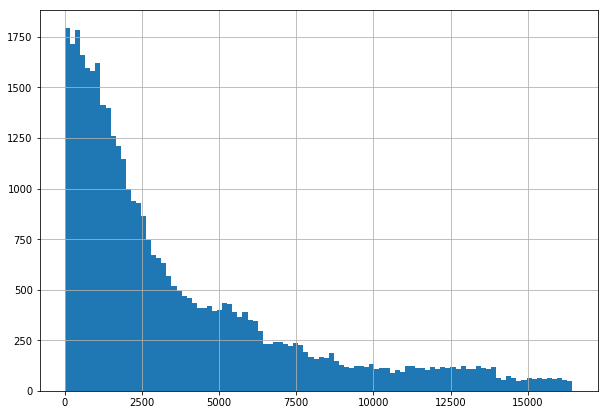

In [40]:
plt.rcParams['figure.figsize'] = (10,7)
df_train['Ranking'].hist(bins=100)

У нас много ресторанов, которые не дотягивают и до 2500 места в своем городе, а что там по городам?

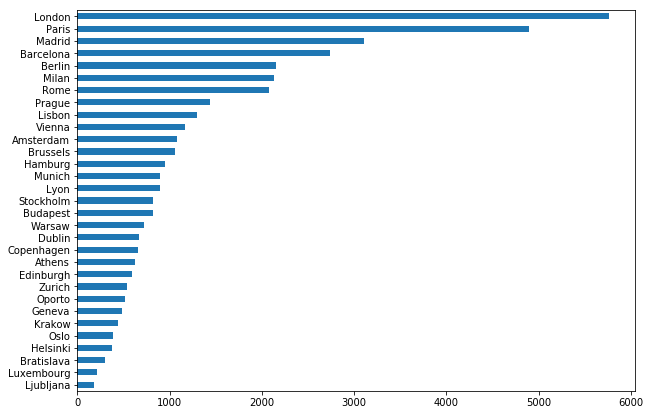

In [41]:
df_train['City'].value_counts(ascending=True).plot(kind='barh')

А кто-то говорил, что французы любят поесть=) Посмотрим, как изменится распределение в большом городе:

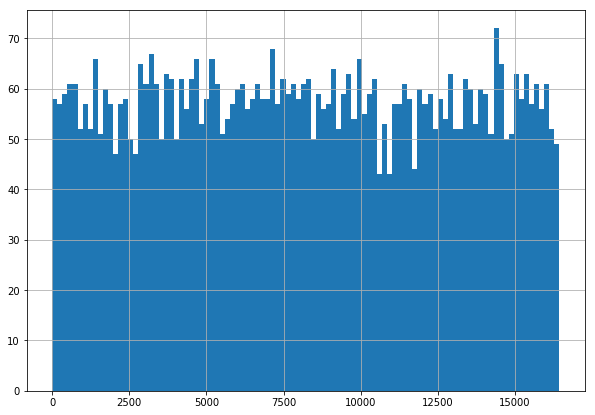

In [42]:
df_train['Ranking'][df_train['City'] =='London'].hist(bins=100)

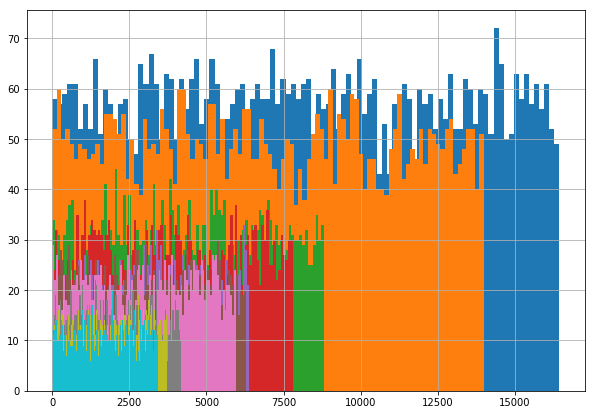

In [43]:
# посмотрим на топ 10 городов
for x in (df_train['City'].value_counts())[0:10].index:
    df_train['Ranking'][df_train['City'] == x].hist(bins=100)
plt.show()

Получается, что Ranking имеет нормальное распределение, просто в больших городах больше ресторанов, из-за мы этого имеем смещение.

>Подумайте как из этого можно сделать признак для вашей модели. Я покажу вам пример, как визуализация помогает находить взаимосвязи. А далее действуйте без подсказок =) 


### Посмотрим распределение целевой переменной

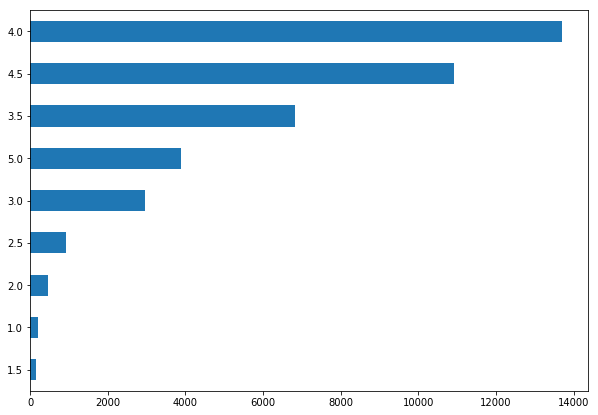

In [44]:
df_train['Rating'].value_counts(ascending=True).plot(kind='barh')

### Посмотрим распределение целевой переменной относительно признака

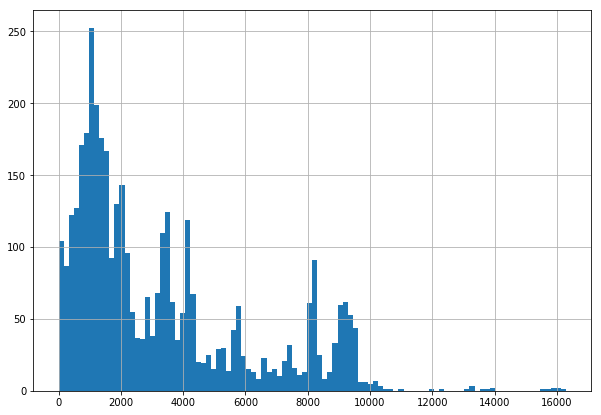

In [45]:
df_train['Ranking'][df_train['Rating'] == 5].hist(bins=100)

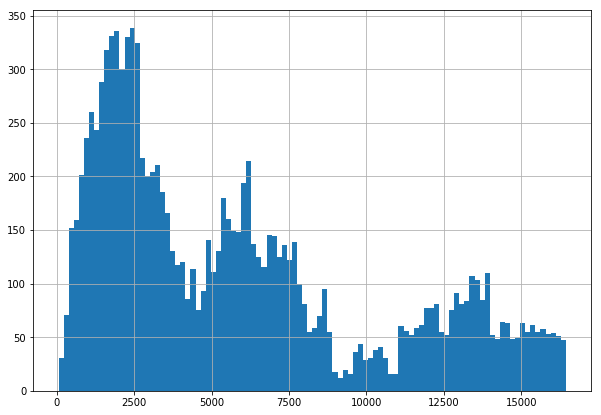

In [46]:
df_train['Ranking'][df_train['Rating'] < 4].hist(bins=100)

### И один из моих любимых - [корреляция признаков](https://ru.wikipedia.org/wiki/Корреляция)
На этом графике уже сейчас вы сможете заметить, как признаки связаны между собой и с целевой переменной.

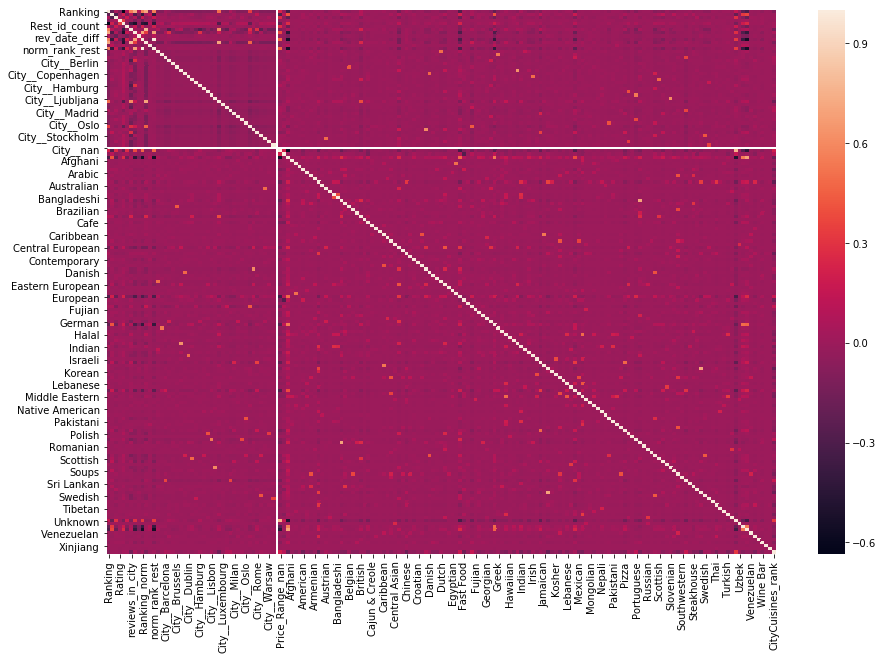

In [47]:
plt.rcParams['figure.figsize'] = (15,10)
sns.heatmap(data.drop(['sample'], axis=1).corr(),)

In [48]:
#Построим корреляционную матрицу с числами
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

/opt/conda/lib/python3.6/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


In [49]:
# Посмотрим какие признаки больше всего влияют на ['Rating']
corr['Rating'].abs().sort_values(ascending = False)[:10]

Rating                 1.000000
sample                 0.936543
Rest_id_count          0.331677
Ranking_norm           0.168783
norm_rank_rest         0.168728
norm_rank_reviews      0.131044
Ranking                0.109897
ID_TA                  0.049589
Vegetarian Friendly    0.037317
Cuisine_num            0.034506
Name: Rating, dtype: float64

In [50]:
# Достаточное высокое влияние оказывают такие показатели как "Vegetarian Friendly" и "ID_TA"

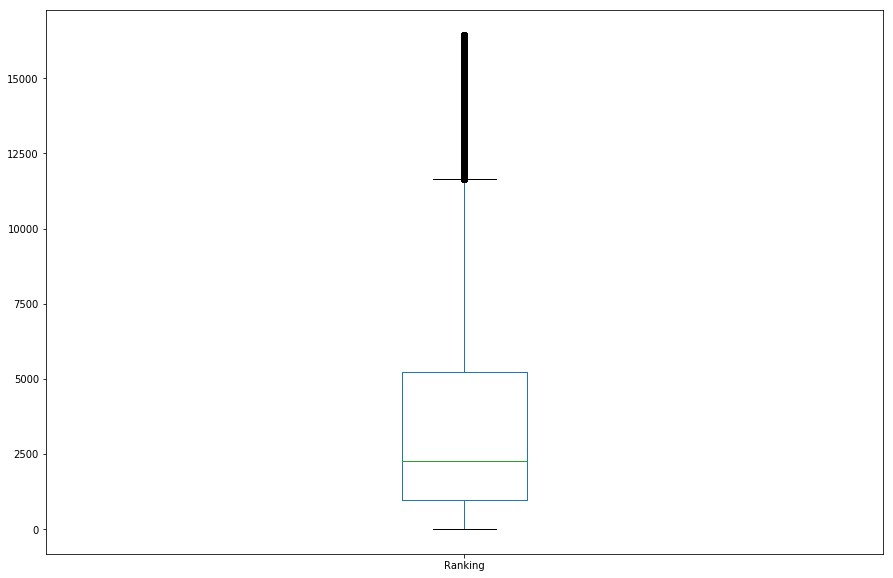

In [51]:
# По графику боксплот столбца ['Ranking'] мы видим кучу значений за пределами усов. 
# Предположительно это можно расценить как выбросы. Но если их привести к значению верхнего уса, то
# MAE повышается. Можно предположить, что наша целевая переменная опирается на эти показатели и не 
# очень придает значение, что по отзывам может идти накрутка или задвоение
data['Ranking'].plot(kind = 'box')

In [52]:
#Распределение приведенного к общему масштабу (нормализованного к 1) признака Рангов:
#Этот вариант признака оказался самым влиятельным в данной модели (по ее мнению)

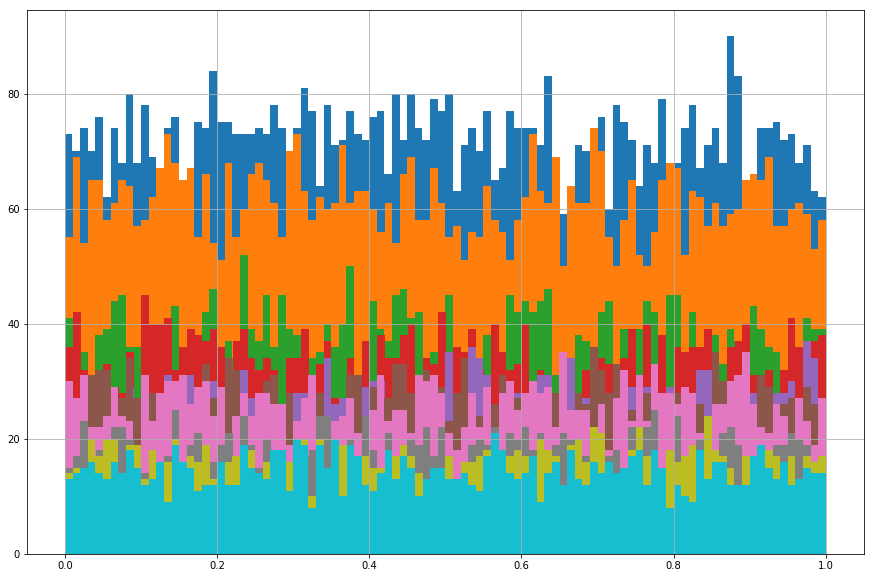

In [53]:
# Топ 10 городов по нормализованному рангу 
for x in (data['City'].value_counts())[0:10].index:
    data['Ranking_norm'][data['City'] == x].hist(bins=100)
plt.show()

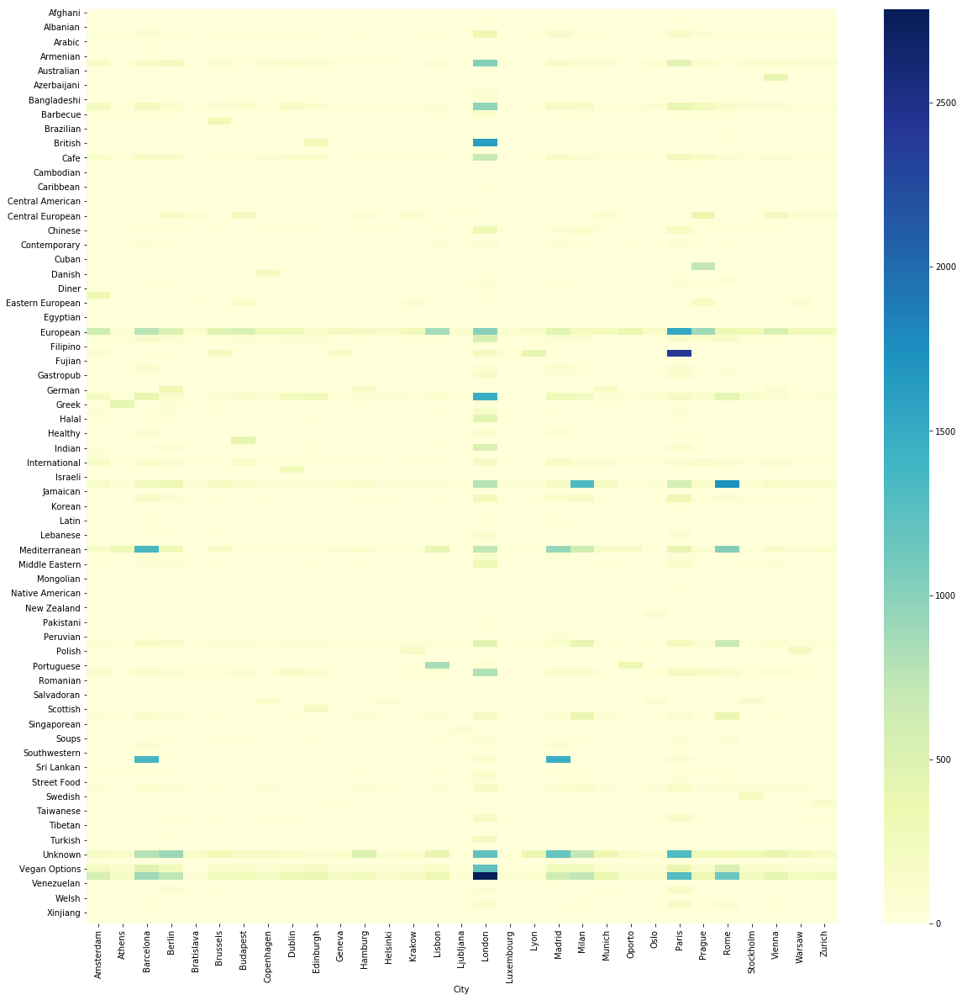

In [54]:
# Посмотрим на стили кухни

plt.subplots(figsize=(20,20))
sns.heatmap(City_Cuisines_dum.T.sort_index(), cmap="YlGnBu")

# На тепловой карте видно, что определенные типы кухонь предпочтительны во всех городах, а какие-то
# только в определенных (специфические кухни). 

In [55]:
City_Cuisines_dum.sum().sort_values(ascending = False)
# Больше всего ресторанов с Vegetarian Friendly и European кухнями

Vegetarian Friendly    14021.0
European               12561.0
Unknown                11590.0
Mediterranean           7820.0
Italian                 7433.0
                        ...   
Yunnan                     2.0
Salvadoran                 1.0
Latvian                    1.0
Xinjiang                   1.0
Burmese                    1.0
Length: 126, dtype: float64

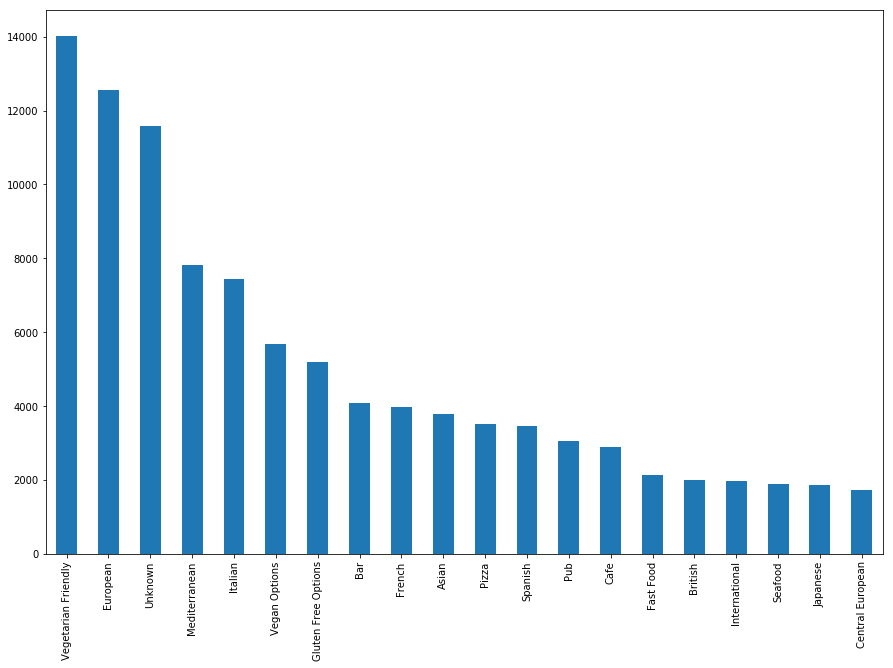

In [56]:
# Популярность стилей кухонь - первая 20-ка
City_Cuisines_dum.sum().sort_values(ascending = False)[:20].plot(kind = 'bar')

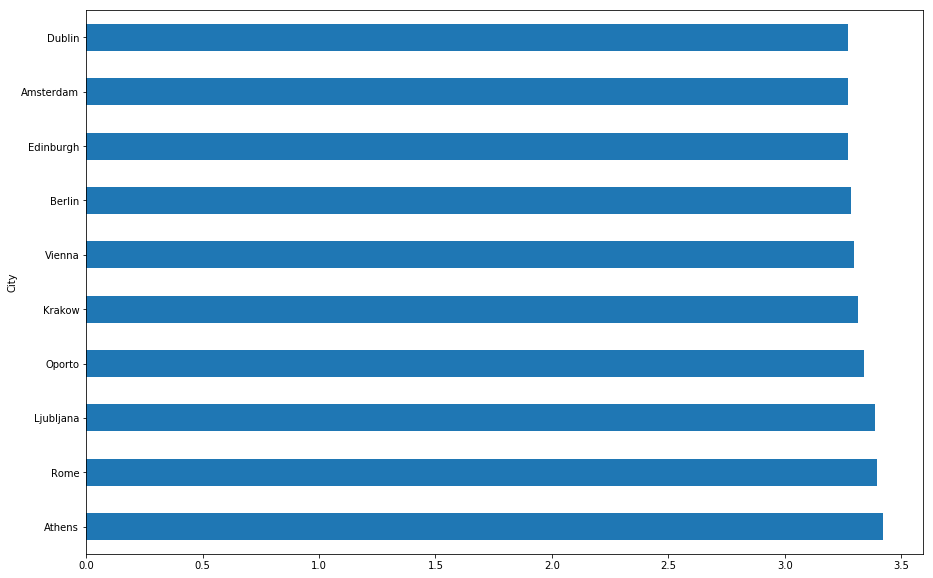

In [57]:
# Города с наивысшим средним рейтингов у ресторанов
data.groupby(['City'])['Rating'].mean().sort_values(ascending=False)[:10].plot(kind='barh')

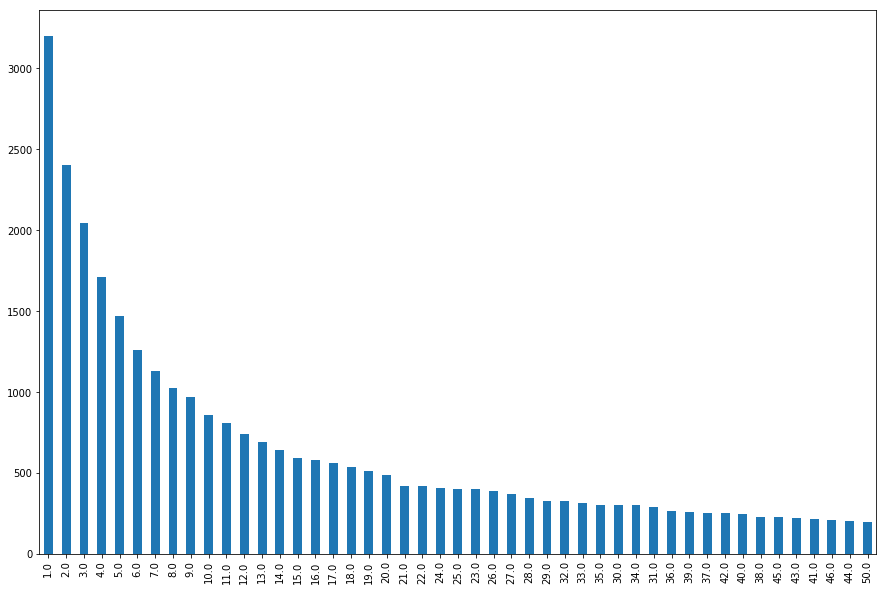

In [58]:
# Посмотрим, сколько ресторанов с каким количеством отзывов унас имеется (top-50):
data['Number of Reviews'].value_counts()[:50].plot(kind='bar')

In [59]:
# Максимальное значение видим на уровне 1 отзыва, но большую часть этих единиц мы получили в результате обработки пропусков

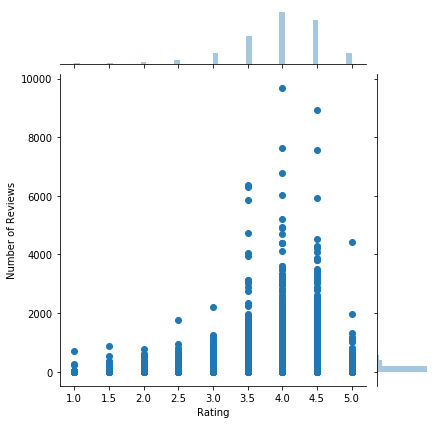

In [60]:
# Как соотносится количество отзывов с рейтингом ресторанов?
sns.jointplot(data=df_train, x="Rating", y="Number of Reviews") #, kind="reg"

In [61]:
# Максимальное количество отзывов мы видим у ресторанов с рейтингом 4 и 4,5.

# Data Preprocessing
Теперь, для удобства и воспроизводимости кода, завернем всю обработку в одну большую функцию.

In [62]:
def preproc_data(df_input):
    '''includes several functions to pre-process the predictor data.'''
    
    df_output = df_input.copy()
    
    # ################### 1. Предобработка ############################################################## 
    # убираем не нужные для модели признаки
    df_output.drop([], axis = 1, inplace=True)
    
    
    l_col = []
    for i in list(df_output.columns):
        if (df_output[i].dtypes == 'datetime64[ns]') or (df_output[i].dtypes == 'object'):
            l_col.append(i)
   
    df_output.drop(l_col, axis = 1, inplace=True)

    
  
    
    
    
    
    return df_output

>По хорошему, можно было бы перевести эту большую функцию в класс и разбить на подфункции (согласно ООП). 

#### Запускаем и проверяем что получилось

In [63]:
df_preproc = preproc_data(data)
df_preproc.sample(10)

,Ranking,Number of Reviews,ID_TA,sample,Rating,Rest_id_count,Number_of_Reviews_isNAN,reviews_in_city,norm_rank_reviews,rev_date_diff,Ranking_norm,rest_in_city,norm_rest_rank,norm_rank_rest,City__Amsterdam,City__Athens,City__Barcelona,City__Berlin,City__Bratislava,City__Brussels,City__Budapest,City__Copenhagen,City__Dublin,City__Edinburgh,City__Geneva,City__Hamburg,City__Helsinki,City__Krakow,City__Lisbon,City__Ljubljana,City__London,City__Luxembourg,City__Lyon,City__Madrid,City__Milan,City__Munich,City__Oporto,City__Oslo,City__Paris,City__Prague,City__Rome,City__Stockholm,City__Vienna,City__Warsaw,City__Zurich,City__nan,Price_Range_nan,Price_Range_num,Cuisine_num,Afghani,African,Albanian,American,Arabic,Argentinean,Armenian,Asian,Australian,Austrian,Azerbaijani,Balti,Bangladeshi,Bar,Barbecue,Belgian,Brazilian,Brew Pub,British,Burmese,Cafe,Cajun & Creole,Cambodian,Canadian,Caribbean,Caucasian,Central American,Central Asian,Central European,Chilean,Chinese,Colombian,Contemporary,Croatian,Cuban,Czech,Danish,Delicatessen,Diner,Dutch,Eastern European,Ecuadorean,Egyptian,Ethiopian,European,Fast Food,Filipino,French,Fujian,Fusion,Gastropub,Georgian,German,Gluten Free Options,Greek,Grill,Halal,Hawaiian,Healthy,Hungarian,Indian,Indonesian,International,Irish,Israeli,Italian,Jamaican,Japanese,Korean,Kosher,Latin,Latvian,Lebanese,Malaysian,Mediterranean,Mexican,Middle Eastern,Minority Chinese,Mongolian,Moroccan,Native American,Nepali,New Zealand,Norwegian,Pakistani,Persian,Peruvian,Pizza,Polish,Polynesian,Portuguese,Pub,Romanian,Russian,Salvadoran,Scandinavian,Scottish,Seafood,Singaporean,Slovenian,Soups,South American,Southwestern,Spanish,Sri Lankan,Steakhouse,Street Food,Sushi,Swedish,Swiss,Taiwanese,Thai,Tibetan,Tunisian,Turkish,Ukrainian,Unknown,Uzbek,Vegan Options,Vegetarian Friendly,Venezuelan,Vietnamese,Welsh,Wine Bar,Xinjiang,Yunnan,CityCuisines_rank
49611,203.0,42.0,12361717,1,4.5,7,0,4608.0,0.044054,14.0,0.163183,554,2.729064,0.366426,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0.578519
43805,1936.0,21.0,12594458,1,4.5,9,0,4996.0,0.387510,57.0,0.248332,3395,1.753616,0.570250,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.538686
19344,1099.0,19.0,4083761,1,4.0,9,0,3206.0,0.342795,1.0,0.740566,642,0.584167,1.711838,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,2.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.998623
15013,991.0,18.0,3417369,1,4.0,13,0,1461.0,0.678303,118.0,0.402192,1033,1.042381,0.959342,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.199690
46550,8637.0,14.0,7969770,1,4.0,4,0,7622.0,1.133167,1.0,0.617546,6108,0.707190,1.414047,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.101329
11354,854.0,

In [64]:
df_preproc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Columns: 176 entries, Ranking to CityCuisines_rank
dtypes: float64(11), int64(6), uint8(159)
memory usage: 14.1 MB


In [65]:
# Теперь выделим тестовую часть
train_data = df_preproc.query('sample == 1').drop(['sample'], axis=1)
test_data = df_preproc.query('sample == 0').drop(['sample'], axis=1)

y = train_data.Rating.values            # наш таргет
X = train_data.drop(['Rating'], axis=1)

**Перед тем как отправлять наши данные на обучение, разделим данные на еще один тест и трейн, для валидации. 
Это поможет нам проверить, как хорошо наша модель работает, до отправки submissiona на kaggle.**

In [66]:
# Воспользуемся специальной функцие train_test_split для разбивки тестовых данных
# выделим 20% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [67]:
# проверяем
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((10000, 175), (40000, 175), (40000, 174), (32000, 174), (8000, 174))

# Model 
Сам ML

In [68]:
# Импортируем необходимые библиотеки:
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели
from sklearn import metrics # инструменты для оценки точности модели

In [69]:
# Создаём модель (НАСТРОЙКИ НЕ ТРОГАЕМ)
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)

In [70]:
# Обучаем модель на тестовом наборе данных
model.fit(X_train, y_train)

# Используем обученную модель для предсказания рейтинга ресторанов в тестовой выборке.
# Предсказанные значения записываем в переменную y_pred
y_pred = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   29.3s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


In [71]:
# Сделаем предсказанные рейтинги более точными, округлив их до кратности шагу рейтинга 0.5
def round_rating_pred(rating_pred):
    if rating_pred <= 0.5:
        return 0.0
    if rating_pred <= 1.5:
        return 1.0
    if rating_pred <= 1.75:
        return 1.5
    if rating_pred <= 2.25:
        return 2.0
    if rating_pred <= 2.75:
        return 2.5
    if rating_pred <= 3.25:
        return 3.0
    if rating_pred <= 3.75:
        return 3.5
    if rating_pred <= 4.25:
        return 4.0
    if rating_pred <= 4.75:
        return 4.5
    return 5.0


y_pred = np.array([round_rating_pred(x) for x in y_pred])

In [72]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они в среднем отличаются
# Метрика называется Mean Absolute Error (MAE) и показывает среднее отклонение предсказанных значений от фактических.
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))

MAE: 0.163875


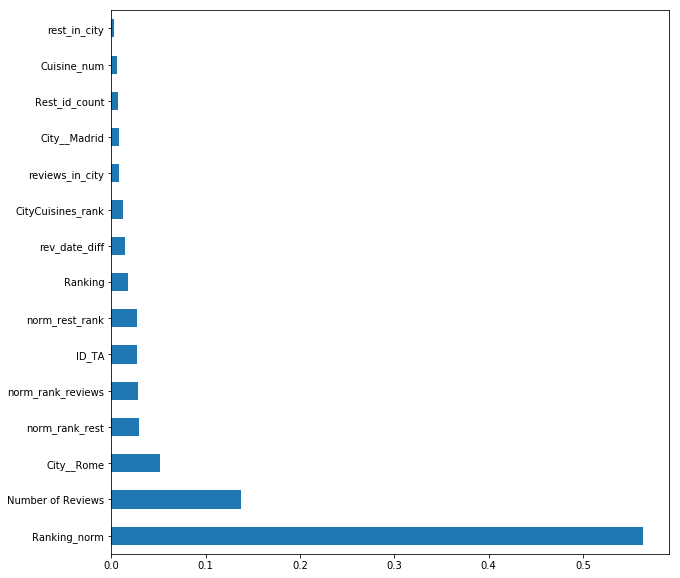

In [73]:
# в RandomForestRegressor есть возможность вывести самые важные признаки для модели
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')

# Submission
Если все устраевает - готовим Submission на кагл

In [74]:
test_data.sample(10)

,Ranking,Number of Reviews,ID_TA,Rating,Rest_id_count,Number_of_Reviews_isNAN,reviews_in_city,norm_rank_reviews,rev_date_diff,Ranking_norm,rest_in_city,norm_rest_rank,norm_rank_rest,City__Amsterdam,City__Athens,City__Barcelona,City__Berlin,City__Bratislava,City__Brussels,City__Budapest,City__Copenhagen,City__Dublin,City__Edinburgh,City__Geneva,City__Hamburg,City__Helsinki,City__Krakow,City__Lisbon,City__Ljubljana,City__London,City__Luxembourg,City__Lyon,City__Madrid,City__Milan,City__Munich,City__Oporto,City__Oslo,City__Paris,City__Prague,City__Rome,City__Stockholm,City__Vienna,City__Warsaw,City__Zurich,City__nan,Price_Range_nan,Price_Range_num,Cuisine_num,Afghani,African,Albanian,American,Arabic,Argentinean,Armenian,Asian,Australian,Austrian,Azerbaijani,Balti,Bangladeshi,Bar,Barbecue,Belgian,Brazilian,Brew Pub,British,Burmese,Cafe,Cajun & Creole,Cambodian,Canadian,Caribbean,Caucasian,Central American,Central Asian,Central European,Chilean,Chinese,Colombian,Contemporary,Croatian,Cuban,Czech,Danish,Delicatessen,Diner,Dutch,Eastern European,Ecuadorean,Egyptian,Ethiopian,European,Fast Food,Filipino,French,Fujian,Fusion,Gastropub,Georgian,German,Gluten Free Options,Greek,Grill,Halal,Hawaiian,Healthy,Hungarian,Indian,Indonesian,International,Irish,Israeli,Italian,Jamaican,Japanese,Korean,Kosher,Latin,Latvian,Lebanese,Malaysian,Mediterranean,Mexican,Middle Eastern,Minority Chinese,Mongolian,Moroccan,Native American,Nepali,New Zealand,Norwegian,Pakistani,Persian,Peruvian,Pizza,Polish,Polynesian,Portuguese,Pub,Romanian,Russian,Salvadoran,Scandinavian,Scottish,Seafood,Singaporean,Slovenian,Soups,South American,Southwestern,Spanish,Sri Lankan,Steakhouse,Street Food,Sushi,Swedish,Swiss,Taiwanese,Thai,Tibetan,Tunisian,Turkish,Ukrainian,Unknown,Uzbek,Vegan Options,Vegetarian Friendly,Venezuelan,Vietnamese,Welsh,Wine Bar,Xinjiang,Yunnan,CityCuisines_rank
8809,6391.0,19.0,8050994,0.0,3,0,7622.0,0.838494,159.0,0.456957,6108,0.955719,1.046333,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.817276
3626,4113.0,208.0,2080672,0.0,3,0,6360.0,0.646698,150.0,0.655458,2694,0.654996,1.526726,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.103030
9123,10471.0,3.0,8483057,0.0,2,0,9660.0,1.083954,24.0,0.636767,7193,0.686945,1.455721,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.434314
5734,218.0,632.0,1006436,0.0,4,0,7622.0,0.028601,51.0,0.015587,6108,28.018349,0.035691,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2.0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.724529
518,198.0,141.0,9853471,0.0,12,0,3491.0,0.056717,1.0,0.101020,836,4.222222,0.236842,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,6,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0.321026
8350,4824.0,262.0,2035065,0.0,

In [75]:
test_data = test_data.drop(['Rating'], axis=1)

In [76]:
sample_submission

,Restaurant_id,Rating
0,id_0,2.0
1,id_1,2.5
2,id_2,4.0
3,id_3,1.0
4,id_4,4.0
...,...,...
9995,id_9995,3.0
9996,id_9996,1.5
9997,id_9997,4.5
9998,id_9998,1.0


In [77]:
predict_submission = model.predict(test_data)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


In [78]:
predict_submission

array([3.11 , 4.26 , 4.21 , ..., 3.02 , 4.475, 4.155])

In [79]:
sample_submission['Rating'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

,Restaurant_id,Rating
0,id_0,3.110
1,id_1,4.260
2,id_2,4.210
3,id_3,4.360
4,id_4,4.460
5,id_5,4.490
6,id_6,1.695
7,id_7,3.380
8,id_8,4.085
9,id_9,4.565


# What's next?
Или что делать, чтоб улучшить результат:
* Обработать оставшиеся признаки в понятный для машины формат
* Посмотреть, что еще можно извлечь из признаков
* Сгенерировать новые признаки
* Подгрузить дополнительные данные, например: по населению или благосостоянию городов
* Подобрать состав признаков

В общем, процесс творческий и весьма увлекательный! Удачи в соревновании!
